# Telecom Churn Case Study

#### `We need to predict which customers are at high risk of churn.`

### Importing and Understanding Data

In [1]:
# Suppress Warnings

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Importing required libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score, classification_report,confusion_matrix, accuracy_score, f1_score
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import precision_recall_curve
pd.options.mode.chained_assignment = None
pd.options.display.max_rows = 230
pd.options.display.max_columns = 230

Using TensorFlow backend.


In [3]:
# Identifying the encoding of the csv files to be used for Group Case Study 1

with open(r'C:\upGrad\Course 3\Telecom Churn - Group Case Study\telecom_churn_data.csv') as f:
    print(f)

<_io.TextIOWrapper name='C:\\upGrad\\Course 3\\Telecom Churn - Group Case Study\\telecom_churn_data.csv' mode='r' encoding='cp1252'>


In [4]:
# Reading data for the Leads file

path = r'C:\upGrad\Course 3\Telecom Churn - Group Case Study'
telecom = pd.read_csv(path+'\\telecom_churn_data.csv')

In [5]:
# Inspecting the leads dataframe

telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

#### Checking for Duplicate IDs

In [6]:
# Making sure that number of duplicate rows are zero

sum(telecom.duplicated(subset = "mobile_number")) == 0

True

#### Primary Checks

In [7]:
# Determining the number of rows and columns in the dataframe

telecom.shape

(99999, 226)

In [8]:
# Checking the information of the entire dataframe

telecom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [9]:
# Describing the statistical parameters of the dataframe

telecom.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

In [10]:
# Viewing the columns in the dataframe

telecom.columns

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6',
       ...
       'sachet_3g_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g'],
      dtype='object', length=226)

### Reviewing Missing Values

In [11]:
# Checking for null values (column-wise) in the dataframe

telecom.isnull().sum()

mobile_number                   0
circle_id                       0
loc_og_t2o_mou               1018
std_og_t2o_mou               1018
loc_ic_t2o_mou               1018
last_date_of_month_6            0
last_date_of_month_7          601
last_date_of_month_8         1100
last_date_of_month_9         1659
arpu_6                          0
arpu_7                          0
arpu_8                          0
arpu_9                          0
onnet_mou_6                  3937
onnet_mou_7                  3859
onnet_mou_8                  5378
onnet_mou_9                  7745
offnet_mou_6                 3937
offnet_mou_7                 3859
offnet_mou_8                 5378
offnet_mou_9                 7745
roam_ic_mou_6                3937
roam_ic_mou_7                3859
roam_ic_mou_8                5378
roam_ic_mou_9                7745
roam_og_mou_6                3937
roam_og_mou_7                3859
roam_og_mou_8                5378
roam_og_mou_9                7745
loc_og_t2t_mou

In [12]:
# Checking for percentage of null values (column-wise) in the dataframe

telecom.isnull().sum() * 100 / len(telecom)

mobile_number                0.000000
circle_id                    0.000000
loc_og_t2o_mou               1.018010
std_og_t2o_mou               1.018010
loc_ic_t2o_mou               1.018010
last_date_of_month_6         0.000000
last_date_of_month_7         0.601006
last_date_of_month_8         1.100011
last_date_of_month_9         1.659017
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
arpu_9                       0.000000
onnet_mou_6                  3.937039
onnet_mou_7                  3.859039
onnet_mou_8                  5.378054
onnet_mou_9                  7.745077
offnet_mou_6                 3.937039
offnet_mou_7                 3.859039
offnet_mou_8                 5.378054
offnet_mou_9                 7.745077
roam_ic_mou_6                3.937039
roam_ic_mou_7                3.859039
roam_ic_mou_8                5.378054
roam_ic_mou_9                7.745077
roam_og_mou_6                3.937039
roam_og_mou_

<font color = purple> *As we can see, there are several variables with missing values in our data. I'll review some of them further in order to facilitate calculations below.* </font>

In [13]:
# Identifying the recharge variables 

rech_vars = [col for col in telecom.columns if '_rech_' in col]

telecom[rech_vars].describe()

,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9
count,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,25153.000000,25571.000000,26339.000000,25922.000000,25153.000000,25571.000000,26339.000000,25922.00000,25153.000000,25571.000000,26339.000000,25922.000000,25153.000000,25571.000000,26339.000000,25922.000000,25153.000000,25571.000000,26339.000000,25922.000000
mean,7.558806,7.700367,7.212912,6.893019,327.514615,322.962970,324.157122,303.345673,104.637486,104.752398,107.728207,101.943889,2.463802,2.666419,2.651999,2.441170,126.393392,126.729459,125.717301,124.94144,1.864668,2.044699,2.016288,1.781807,0.599133,0.621720,0.635711,0.659363,192.600982,200.981292,197.526489,192.734315
std,7.078405,7.070422,7.203753,7.096261,398.019701,408.114237,416.540455,404.588583,120.614894,124.523970,126.902505,125.375109,2.789128,3.031593,3.074987,2.516339,108.477235,109.765267,109.437851,111.36376,2.570254,2.768332,2.720132,2.214701,1.274428,1.394524,1.422827,1.411513,192.646318,196.791224,191.301305,188.400286
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.500000,0.500000,1.000000
25%,3.000000,3.000000,3.000000,3.000000,109.000000,100.000000,90.000000,52.000000,30.000000,30.000000,30.000000,28.000000,1.000000,1.000000,1.000000,1.000000,25.000000,25.000000,25.000000,25.00000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,82.000000,92.000000,87.000000,69.000000
50%,6.000000,6.000000,5.000000,5.000000,230.000000,220.000000,225.000000,200.000000,110.000000,110.000000,98.000000,61.000000,1.000000,1.000000,1.000000,2.000000,145.000000,145.000000,145.000000,145.00000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,154.000000,154.000000,154.000000,164.000000
75%,9.000000,10.000000,9.000000,9.000000,437.500000,428.000000,434.500000,415.000000,120.000000,128.000000,144.000000,144.000000,3.000000,3.000000,3.000000,3.000000,177.000000,177.000000,179.000000,179.00000,2.000000,2.000000,2.000000,2.000000,1.000000,1.000000,1.000000,1.000000,252.000000,252.000000,252.000000,252.000000
max,307.000000,138.000000,196.000000,131.000000,35190.000000,40335.000000,45320.000000,37235.000000,4010.000000,4010.000000,4449.000000,3399.000000,61.000000,54.000000,60.000000,84.000000,1555.000000,1555.000000,1555.000000,1555.00000,42.000000,48.000000,44.000000,40.000000,29.000000,35.000000,45.000000,49.000000,7546.000000,4365.000000,4076.000000,4061.000000


In [14]:
# Imputing (with 0) missing values of recharge columns where the minimum value is 1.
# These were likely to be instances where the customer did not recharge.

impute_vars = ['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9', 'max_rech_data_6', 
               'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 
               'av_rech_amt_data_8', 'av_rech_amt_data_9']

telecom[impute_vars] = telecom[impute_vars].apply(lambda x: x.fillna(0))

### Filtering High-Value Customers
Customers who have recharged with an amount more than or equal to the 70th percentile of the average recharge amount in the first two months

In [15]:
# Calculating the total data recharge amount for June and July - number of recharges * average recharge amount

telecom['total_data_rech_amt_6'] = telecom['total_rech_num_6'] * telecom['av_rech_amt_data_6']

telecom['total_data_rech_amt_7'] = telecom['total_rech_num_7'] * telecom['av_rech_amt_data_7']

In [16]:
# Calculating the total recharge amount for June and July - call recharge amount (total_rech_amt) + data recharge amount

 
telecom['rech_amt_6'] = telecom['total_rech_amt_6'] + telecom['total_data_rech_amt_6']

telecom['rech_amt_7'] = telecom['total_rech_amt_7'] + telecom['total_data_rech_amt_7']

In [17]:
# Calculating the average recharge amount by the customer for June and July

telecom['avg_rech_amt_6_7'] = telecom[['rech_amt_6', 'rech_amt_7']].mean(axis=1)

telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,...,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,rech_amt_6,rech_amt_7,avg_rech_amt_6_7
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,...,NaN,NaN,NaN,0.00,NaN,0.

In [18]:
# Calculating the 70th percentile of the average recharge amount in the first two months

telecom['avg_rech_amt_6_7'].quantile(0.7)

639.0

In [19]:
telecom = telecom[telecom['avg_rech_amt_6_7'] >= telecom['avg_rech_amt_6_7'].quantile(0.7)]

telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,...,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,rech_amt_6,rech_amt_7,avg_rech_amt_6_7
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,...,NaN,NaN,NaN,0.00,NaN,0

In [20]:
# Remove variables created to filter high-value customers

telecom = telecom.drop(['total_data_rech_amt_6', 'total_data_rech_amt_7', 
                        'rech_amt_6', 'rech_amt_7', 'avg_rech_amt_6_7'], axis=1)

telecom.shape

(30010, 226)

### Tagging churners

In [21]:
# Creating a new column to tag churned customers

telecom['churn'] = np.where(((telecom['total_ic_mou_9']==0.00) & (telecom['total_og_mou_9']==0.00)) & 
                            ((telecom['vol_2g_mb_9']==0.00) & (telecom['vol_3g_mb_9']==0.00)), 1, 0)
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,churn
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00

In [22]:
# Checking value counts for the 'churn' column

telecom['churn'].value_counts()

0    27594
1     2416
Name: churn, dtype: int64

### Removing attributes of the churn phase

In [23]:
# Removing all the attributes corresponding to the churn phase (all attributes having ‘ _9’, etc. in their names).

for col in telecom.columns:
    if '_9' in col:
        telecom.drop(col, axis=1, inplace=True)

In [24]:
# Checking the shape of the telecom dataframe

telecom.shape

(30010, 173)

### Handling Missing Values

In [25]:
# Reviewing percentage of null values (column-wise) in the dataframe

telecom.isnull().sum() * 100 / len(telecom)

mobile_number                0.000000
circle_id                    0.000000
loc_og_t2o_mou               0.799733
std_og_t2o_mou               0.799733
loc_ic_t2o_mou               0.799733
last_date_of_month_6         0.000000
last_date_of_month_7         0.109963
last_date_of_month_8         0.616461
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
onnet_mou_6                  2.115961
onnet_mou_7                  2.049317
onnet_mou_8                  4.208597
offnet_mou_6                 2.115961
offnet_mou_7                 2.049317
offnet_mou_8                 4.208597
roam_ic_mou_6                2.115961
roam_ic_mou_7                2.049317
roam_ic_mou_8                4.208597
roam_og_mou_6                2.115961
roam_og_mou_7                2.049317
roam_og_mou_8                4.208597
loc_og_t2t_mou_6             2.115961
loc_og_t2t_mou_7             2.049317
loc_og_t2t_mou_8             4.208597
loc_og_t2m_m

<font color = purple> *As we can see, there are several variables with missing values in our data. I'll remove the rows for variables with a small percentage of missing values while dropping columns for those with over `30%` of their values missing.* </font>

In [26]:
# Removing rows for variables with a small percentage of null values

null_vars = ['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_7', 'last_date_of_month_8', 
             'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 
             'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 
             'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 
             'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 
             'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 
             'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 
             'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 
             'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 
             'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 
             'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7', 
             'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7', 'loc_ic_t2f_mou_8', 'loc_ic_mou_6', 
             'loc_ic_mou_7', 'loc_ic_mou_8', 'std_ic_t2t_mou_6', 'std_ic_t2t_mou_7', 'std_ic_t2t_mou_8', 
             'std_ic_t2m_mou_6', 'std_ic_t2m_mou_7', 'std_ic_t2m_mou_8', 'std_ic_t2f_mou_6', 'std_ic_t2f_mou_7', 
             'std_ic_t2f_mou_8', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8', 'std_ic_mou_6', 
             'std_ic_mou_7', 'std_ic_mou_8', 'spl_ic_mou_6', 'spl_ic_mou_7', 'spl_ic_mou_8', 'isd_ic_mou_6', 
             'isd_ic_mou_7', 'isd_ic_mou_8', 'ic_others_6', 'ic_others_7', 'ic_others_8', 'date_of_last_rech_6', 
             'date_of_last_rech_7', 'date_of_last_rech_8']

for col in null_vars:
    telecom = telecom[~pd.isnull(telecom[col])]

In [27]:
# Dropping the columns that have more than 30% of their values missing.
# Also dropping 'mobile_number' and 'circle_id' since they will not be of any value as predictor variables. 

telecom.drop(['mobile_number', 'circle_id', 'date_of_last_rech_data_6', 'date_of_last_rech_data_7', 
              'date_of_last_rech_data_8', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_3g_6', 
              'count_rech_3g_7', 'count_rech_3g_8', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7', 
              'arpu_2g_8', 'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'fb_user_6', 'fb_user_7', 
              'fb_user_8'], axis=1, inplace=True)

telecom.head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,churn
1,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,34.047,355.074,268.321,24.11,78.68,7.68,15.74,99.84,304.76,0.00,0.00,0.00,0.00,0.00,0.00,23.88,74.56,7.68,11.51,75.94,291.86,0.00,0.00,0.00,0.0,2.91,0.00,35.39,150.51,299.54,0.23,4.11,0.00,0.00,0.46,0.13,0.00,0.00,0.00,0.0,0.0,0.0,0.23,4.58,0.13,0.0,0.00,0.00,4.68,23.43,12.76,0.0,0.0,0.0,40.31,178.53,312.44,1.61,29.91,29.23,17.48,65.38,375.58,0.00,8.93,3.61,19.09,104.23,408.43,0.00,0.00,2.35,5.90,0.00,12.49,0.00,0.00,0.00,0.0,0.0,0.0,5.90,0.00,14.84,26.83,104.23,423.28,0.00,0.0,0.0,1.83,0.00,0.00,0.00,0.00,0.00,4,9,11,74,384,283,44,154,65,6/29/2014,7/31/2014,8/28/2014,44,23,30,0.0,1.0,2.0,0.0,154.0,25.0,0.0,154.0,50.0,0.0,108.07,365.47,0.0,0.00,0.00,0,1,0,0,0,2,0,0,0,0,0,0,1006,0.00,0.00,0.00,0.0,0
7,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.00,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,0.0,0.0,0.0,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,0.0,0.0,0.0,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,6/27/2014,7/25/2014,8/26/2014,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1
8,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.00,7.15,378.09,2

In [28]:
# Checking percentage of missing values after removing the appropriate rows and columns above

round(telecom.isnull().sum() * 100 / len(telecom), 2)

loc_og_t2o_mou          0.0
std_og_t2o_mou          0.0
loc_ic_t2o_mou          0.0
last_date_of_month_6    0.0
last_date_of_month_7    0.0
last_date_of_month_8    0.0
arpu_6                  0.0
arpu_7                  0.0
arpu_8                  0.0
onnet_mou_6             0.0
onnet_mou_7             0.0
onnet_mou_8             0.0
offnet_mou_6            0.0
offnet_mou_7            0.0
offnet_mou_8            0.0
roam_ic_mou_6           0.0
roam_ic_mou_7           0.0
roam_ic_mou_8           0.0
roam_og_mou_6           0.0
roam_og_mou_7           0.0
roam_og_mou_8           0.0
loc_og_t2t_mou_6        0.0
loc_og_t2t_mou_7        0.0
loc_og_t2t_mou_8        0.0
loc_og_t2m_mou_6        0.0
loc_og_t2m_mou_7        0.0
loc_og_t2m_mou_8        0.0
loc_og_t2f_mou_6        0.0
loc_og_t2f_mou_7        0.0
loc_og_t2f_mou_8        0.0
loc_og_t2c_mou_6        0.0
loc_og_t2c_mou_7        0.0
loc_og_t2c_mou_8        0.0
loc_og_mou_6            0.0
loc_og_mou_7            0.0
loc_og_mou_8        

In [29]:
# Checking the shape of the telecom dataframe

telecom.shape

(28016, 150)

### Data Preparation
#### Categorical Variables

In [30]:
# Creating a list of categorical variables from the telecom dataframe

cat_vars = telecom.select_dtypes(include=['object']).columns
cat_vars

Index(['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8'],
      dtype='object')

In [31]:
# Retrieving frequency distribution for the categorical variables' unique values

for i in cat_vars:
    print(telecom[i].value_counts().to_frame(), end='\n\n')

           last_date_of_month_6
6/30/2014                 28016

           last_date_of_month_7
7/31/2014                 28016

           last_date_of_month_8
8/31/2014                 28016

           date_of_last_rech_6
6/30/2014                 7317
6/29/2014                 4759
6/28/2014                 3326
6/27/2014                 3142
6/26/2014                 1684
6/25/2014                 1277
6/24/2014                  994
6/23/2014                  689
6/21/2014                  686
6/14/2014                  547
6/22/2014                  510
6/17/2014                  508
6/18/2014                  444
6/19/2014                  414
6/20/2014                  408
6/12/2014                  292
6/13/2014                  278
6/16/2014                  232
6/15/2014                  167
6/11/2014                   74
6/8/2014                    56
6/7/2014                    42
6/10/2014                   37
6/9/2014                    35
6/5/2014                    30

In [32]:
# Converting the categorical variables above to datetime format

telecom[cat_vars] = telecom[cat_vars].apply(pd.to_datetime)

In [33]:
# Retaining only the day for each of the categorical variables above

telecom[cat_vars] = telecom[cat_vars].apply(lambda x: x.dt.day)
telecom[cat_vars].head()

,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8
1,30,31,31,29,31,28
7,30,31,31,27,25,26
8,30,31,31,25,31,30
21,30,31,31,30,31,31
23,30,31,31,18,7,24


In [34]:
# Retrieving frequency distribution for the categorical variables' unique values

for i in cat_vars:
    print(telecom[i].value_counts().to_frame(), end='\n\n')

    last_date_of_month_6
30                 28016

    last_date_of_month_7
31                 28016

    last_date_of_month_8
31                 28016

    date_of_last_rech_6
30                 7317
29                 4759
28                 3326
27                 3142
26                 1684
25                 1277
24                  994
23                  689
21                  686
14                  547
22                  510
17                  508
18                  444
19                  414
20                  408
12                  292
13                  278
16                  232
15                  167
11                   74
8                    56
7                    42
10                   37
9                    35
5                    30
3                    19
4                    17
6                    15
2                     9
1                     8

    date_of_last_rech_7
31                 6954
30                 4792
29                 3209
28    

In [35]:
# Removing variables with only one unique value

telecom.drop(['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8'], axis=1, inplace=True)

telecom.head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,churn
1,0.0,0.0,0.0,34.047,355.074,268.321,24.11,78.68,7.68,15.74,99.84,304.76,0.00,0.00,0.00,0.00,0.00,0.00,23.88,74.56,7.68,11.51,75.94,291.86,0.00,0.00,0.00,0.0,2.91,0.00,35.39,150.51,299.54,0.23,4.11,0.00,0.00,0.46,0.13,0.00,0.00,0.00,0.0,0.0,0.0,0.23,4.58,0.13,0.0,0.00,0.00,4.68,23.43,12.76,0.0,0.0,0.0,40.31,178.53,312.44,1.61,29.91,29.23,17.48,65.38,375.58,0.00,8.93,3.61,19.09,104.23,408.43,0.00,0.00,2.35,5.90,0.00,12.49,0.00,0.00,0.00,0.0,0.0,0.0,5.90,0.00,14.84,26.83,104.23,423.28,0.00,0.0,0.0,1.83,0.00,0.00,0.00,0.00,0.00,4,9,11,74,384,283,44,154,65,29,31,28,44,23,30,0.0,1.0,2.0,0.0,154.0,25.0,0.0,154.0,50.0,0.0,108.07,365.47,0.0,0.00,0.00,0,1,0,0,0,2,0,0,0,0,0,0,1006,0.00,0.00,0.00,0.0,0
7,0.0,0.0,0.0,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.00,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,0.0,0.0,0.0,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,0.0,0.0,0.0,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,27,25,26,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1
8,0.0,0.0,0.0,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.00,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,0.0,0.0,0.0,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.0,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0

### Data Preparation
#### Numerical Variables

In [36]:
# Creating a list of numerical variables from the telecom dataframe

num_vars = telecom.select_dtypes(exclude=['object']).columns

num_vars

Index(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'arpu_6',
       'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8',
       'offnet_mou_6',
       ...
       'monthly_3g_8', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8', 'aon',
       'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g', 'churn'],
      dtype='object', length=147)

In [37]:
# Retrieving frequency distribution for the numerical variables' unique values

for i in num_vars:
    print(telecom[i].value_counts().to_frame(), end='\n\n')

     loc_og_t2o_mou
0.0           28016

     std_og_t2o_mou
0.0           28016

     loc_ic_t2o_mou
0.0           28016

          arpu_6
0.000        154
130.450       14
130.449       12
213.822        9
213.821        8
167.883        8
213.810        6
122.794        6
167.882        6
213.804        5
130.445        5
130.443        5
213.818        5
213.824        4
130.425        4
167.879        4
213.817        4
167.876        4
167.878        4
213.809        4
93.581         3
167.861        3
1.000          3
167.881        3
213.803        3
523.205        3
260.885        3
130.457        3
128.749        3
427.644        3
130.446        3
412.127        3
0.750          3
0.010          3
213.820        3
130.437        3
0.160          2
642.164        2
122.789        2
283.623        2
408.681        2
762.224        2
674.464        2
173.500        2
186.875        2
612.983        2
1303.692       2
283.200        2
445.868        2
213.797        2
275.260   

         loc_og_t2t_mou_8
0.00                 4093
0.81                   33
0.38                   31
0.93                   31
0.48                   31
0.28                   28
0.36                   28
0.88                   27
1.01                   26
1.03                   26
1.13                   26
0.33                   25
0.50                   25
0.83                   25
0.31                   25
0.43                   25
1.33                   24
1.11                   24
1.23                   23
0.41                   23
0.40                   23
0.70                   23
1.48                   23
0.66                   22
0.73                   22
0.63                   21
0.21                   21
2.41                   21
2.61                   20
1.93                   20
1.86                   20
1.16                   20
1.68                   20
0.58                   20
0.55                   20
2.38                   20
0.30                   19
0.61        

[9472 rows x 1 columns]

         std_og_t2t_mou_8
0.00                14446
0.50                   27
0.96                   23
0.63                   22
0.31                   22
0.43                   21
0.46                   20
0.56                   19
0.30                   19
0.38                   19
0.41                   18
0.75                   17
0.88                   17
0.18                   17
0.48                   17
0.60                   17
0.33                   17
0.45                   17
0.70                   17
0.26                   17
0.28                   17
0.85                   16
1.28                   16
0.58                   16
0.98                   15
1.76                   15
0.81                   15
1.46                   15
0.65                   15
1.11                   15
1.18                   15
0.76                   15
2.26                   15
1.68                   14
2.01                   14
0.01                   14
0.83         

[792 rows x 1 columns]

        spl_og_mou_6
0.00           13197
0.21              98
0.01              76
0.03              74
0.08              69
0.43              65
0.16              61
0.05              61
0.06              60
0.10              59
0.55              59
0.20              57
0.15              57
0.73              56
0.41              55
0.63              54
0.71              54
0.86              53
0.36              52
0.81              51
0.58              49
0.88              49
0.66              48
0.18              46
0.23              45
0.83              45
0.25              44
0.76              44
0.78              43
0.48              43
0.56              43
0.60              43
0.31              42
1.03              42
0.80              41
0.61              41
0.28              40
0.11              40
0.53              40
1.08              40
0.26              39
0.46              39
0.68              39
1.01              39
0.65              38
1.21      

[4706 rows x 1 columns]

         loc_ic_t2f_mou_7
0.00                 8432
0.50                   78
0.28                   70
0.41                   68
0.36                   67
0.31                   64
0.56                   64
0.25                   63
0.40                   61
0.38                   61
0.81                   60
0.63                   60
0.26                   60
0.58                   59
0.43                   59
0.53                   58
0.23                   57
0.51                   56
0.65                   56
0.30                   55
0.55                   55
0.33                   55
0.71                   55
0.48                   55
0.20                   54
0.18                   54
0.91                   54
0.46                   53
0.21                   52
0.66                   52
0.93                   52
0.83                   51
0.35                   51
0.61                   50
0.86                   49
0.98                   47
0.88         

[1897 rows x 1 columns]

     std_ic_t2o_mou_6
0.0             28016

     std_ic_t2o_mou_7
0.0             28016

     std_ic_t2o_mou_8
0.0             28016

         std_ic_mou_6
0.00             5489
0.43               60
0.48               52
0.26               51
0.31               48
0.30               48
0.33               44
0.51               44
0.35               43
0.46               43
0.20               43
0.41               40
0.21               40
0.36               40
0.28               39
0.63               37
0.23               37
0.40               37
0.03               37
0.18               37
0.91               36
0.76               36
0.78               36
0.56               36
0.45               35
0.66               35
0.71               34
0.13               33
1.36               33
0.58               32
0.38               32
0.61               31
1.16               30
1.18               30
1.78               30
0.53               30
0.68               29
1.01

79                  1

     total_rech_num_7
6                2388
5                2341
4                2124
7                2088
8                2000
9                1809
10               1677
3                1442
11               1389
12               1277
13               1078
14                932
15                762
16                686
2                 647
17                588
18                547
19                439
20                412
21                349
22                279
23                273
24                246
25                205
1                 182
26                171
27                160
28                157
29                133
30                115
31                 95
32                 91
33                 75
34                 67
36                 65
35                 65
37                 53
39                 51
38                 50
40                 46
41                 34
45                 33
43                 32
42       

         vol_3g_mb_7
0.00           15507
0.01              15
0.07               6
0.06               5
0.05               5
0.02               5
0.10               5
0.21               4
0.26               4
0.84               4
0.14               4
4.69               3
13.25              3
544.83             3
403.09             3
0.08               3
0.42               3
742.85             3
0.36               3
3.68               3
329.99             3
0.04               3
1073.96            3
0.56               3
0.27               3
516.63             3
1013.74            3
0.13               3
0.29               3
151.42             3
1.76               3
493.28             3
0.49               3
592.01             3
202.64             3
693.48             2
103.80             2
448.61             2
467.39             2
797.58             2
182.05             2
868.97             2
130.96             2
301.02             2
531.15             2
278.42             2
392.04       

In [38]:
# Identifying variables with only one unique value

for i in num_vars:
    if len(telecom[i].value_counts())==1:
        print(i)

loc_og_t2o_mou
std_og_t2o_mou
loc_ic_t2o_mou
std_og_t2c_mou_6
std_og_t2c_mou_7
std_og_t2c_mou_8
std_ic_t2o_mou_6
std_ic_t2o_mou_7
std_ic_t2o_mou_8


In [39]:
# Removing variables with only one unique value

telecom.drop(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 
              'std_og_t2c_mou_8', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8'], axis=1, inplace=True)

telecom.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,churn
1,34.047,355.074,268.321,24.11,78.68,7.68,15.74,99.84,304.76,0.00,0.00,0.00,0.00,0.00,0.00,23.88,74.56,7.68,11.51,75.94,291.86,0.00,0.00,0.00,0.0,2.91,0.00,35.39,150.51,299.54,0.23,4.11,0.00,0.00,0.46,0.13,0.00,0.00,0.00,0.23,4.58,0.13,0.0,0.00,0.00,4.68,23.43,12.76,0.0,0.0,0.0,40.31,178.53,312.44,1.61,29.91,29.23,17.48,65.38,375.58,0.00,8.93,3.61,19.09,104.23,408.43,0.00,0.00,2.35,5.90,0.00,12.49,0.00,0.00,0.00,5.90,0.00,14.84,26.83,104.23,423.28,0.00,0.0,0.0,1.83,0.00,0.00,0.00,0.00,0.00,4,9,11,74,384,283,44,154,65,29,31,28,44,23,30,0.0,1.0,2.0,0.0,154.0,25.0,0.0,154.0,50.0,0.0,108.07,365.47,0.0,0.00,0.00,0,1,0,0,0,2,0,0,0,0,0,0,1006,0.00,0.00,0.00,0.0,0
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.00,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,27,25,26,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.00,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.0,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,25,31,30,50,0,10,0.0,2.0,3.0,0.0,154.0,23.0,0.0,177.0,69

In [40]:
# Checking the shape of the telecom dataframe

telecom.shape

(28016, 138)

### Checking for Outliers

In [41]:
# Checking outliers at 25%, 50%, 75%, 90%, 95% and 99%

telecom.drop('churn', axis=1).describe(percentiles=[.25,.5,.75,.90,.95,.99])

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000,28016.000000
mean,521.367477,532.975475,494.653497,229.399502,238.667890,213.215700,334.708752,345.216156,311.366976,15.086655,11.778794,12.407329,24.332976,18.411618,19.041571,80.021163,81.989867,75.679332,150.9873

<font color = purple> *From the distribution shown above, we can see that there are outliers in our data for several features. The numbers are not gradually increasing for these variables.* </font>

In [42]:
# Creating a list of variables to check for outliers

out_vars = telecom.drop('churn', axis=1).columns

out_vars

Index(['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8',
       'roam_ic_mou_6',
       ...
       'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6', 'sachet_3g_7',
       'sachet_3g_8', 'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g',
       'sep_vbc_3g'],
      dtype='object', length=137)

In [43]:
# Checking each of the aforementioned variables for their respective number of outliers

for i in out_vars:

    Q1 = telecom[i].quantile(0.25)        # taking the value of first quantile for each column
    Q3 = telecom[i].quantile(0.75)        # taking the value of third quantile for each column

    IQR = Q3 - Q1                          # finding the inter-quartile range

    lower_fence = Q1 - 1.5*IQR             # calculating the lower fence
    upper_fence = Q3 + 1.5*IQR             # calculating the upper fence

    # Capturing all the values lower than the lower fence and higher than the upper fence
    outliers = (telecom[i] < lower_fence) | (telecom[i] > upper_fence)
    
    # setting the title of the column
    print(i)                    
    
    # printing the outlier value count for the column
    print(outliers.value_counts(), end='\n\n')

arpu_6
False    27027
True       989
Name: arpu_6, dtype: int64

arpu_7
False    26932
True      1084
Name: arpu_7, dtype: int64

arpu_8
False    26810
True      1206
Name: arpu_8, dtype: int64

onnet_mou_6
False    24556
True      3460
Name: onnet_mou_6, dtype: int64

onnet_mou_7
False    24527
True      3489
Name: onnet_mou_7, dtype: int64

onnet_mou_8
False    24564
True      3452
Name: onnet_mou_8, dtype: int64

offnet_mou_6
False    25832
True      2184
Name: offnet_mou_6, dtype: int64

offnet_mou_7
False    25874
True      2142
Name: offnet_mou_7, dtype: int64

offnet_mou_8
False    25885
True      2131
Name: offnet_mou_8, dtype: int64

roam_ic_mou_6
False    22263
True      5753
Name: roam_ic_mou_6, dtype: int64

roam_ic_mou_7
False    23611
True      4405
Name: roam_ic_mou_7, dtype: int64

roam_ic_mou_8
False    23194
True      4822
Name: roam_ic_mou_8, dtype: int64

roam_og_mou_6
False    22268
True      5748
Name: roam_og_mou_6, dtype: int64

roam_og_mou_7
False    23622
True

total_rech_data_7
False    25170
True      2846
Name: total_rech_data_7, dtype: int64

total_rech_data_8
False    25549
True      2467
Name: total_rech_data_8, dtype: int64

max_rech_data_6
False    27649
True       367
Name: max_rech_data_6, dtype: int64

max_rech_data_7
False    27627
True       389
Name: max_rech_data_7, dtype: int64

max_rech_data_8
False    27611
True       405
Name: max_rech_data_8, dtype: int64

av_rech_amt_data_6
False    26733
True      1283
Name: av_rech_amt_data_6, dtype: int64

av_rech_amt_data_7
False    27174
True       842
Name: av_rech_amt_data_7, dtype: int64

av_rech_amt_data_8
False    26588
True      1428
Name: av_rech_amt_data_8, dtype: int64

vol_2g_mb_6
False    24026
True      3990
Name: vol_2g_mb_6, dtype: int64

vol_2g_mb_7
False    23990
True      4026
Name: vol_2g_mb_7, dtype: int64

vol_2g_mb_8
False    23685
True      4331
Name: vol_2g_mb_8, dtype: int64

vol_3g_mb_6
False    25285
True      2731
Name: vol_3g_mb_6, dtype: int64

vol_3g_mb_

### Handling Outliers by Capping them using the IQR method

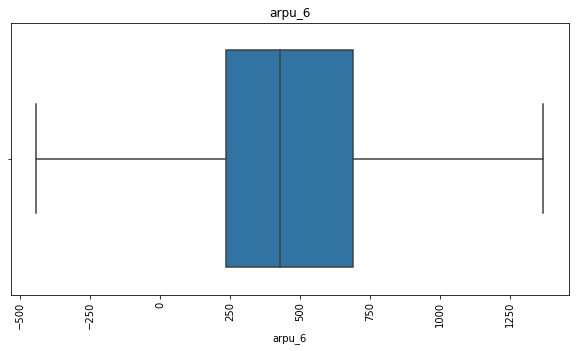

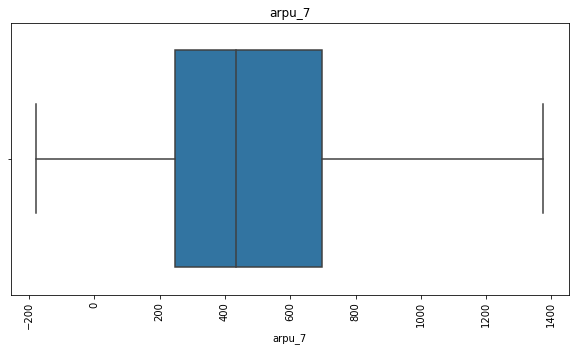

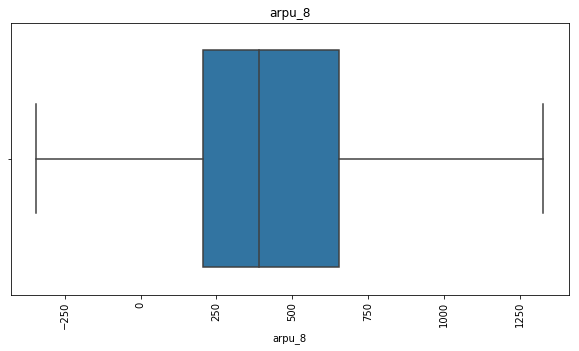

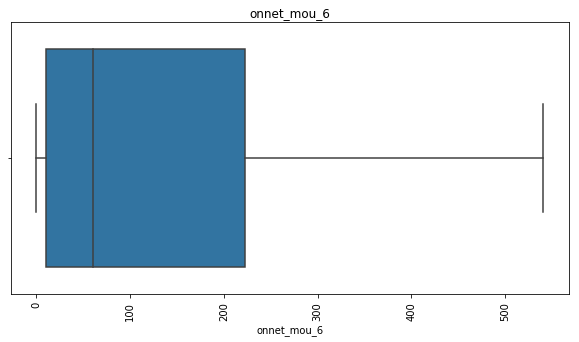

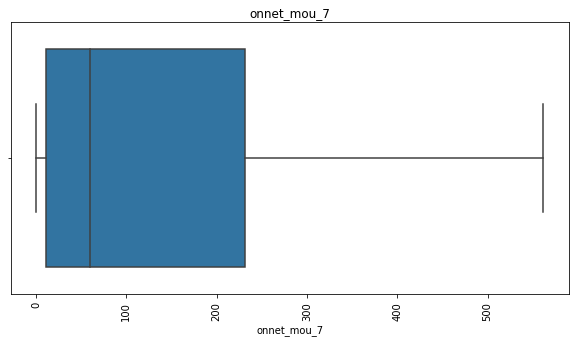

...

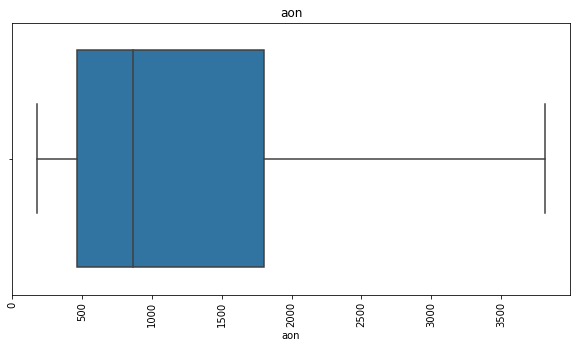

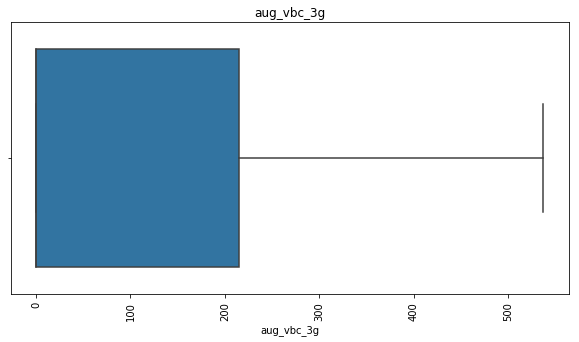

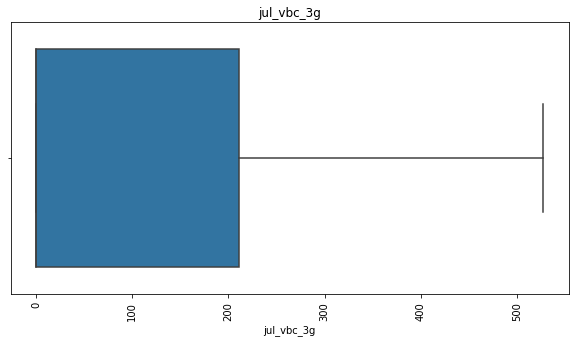

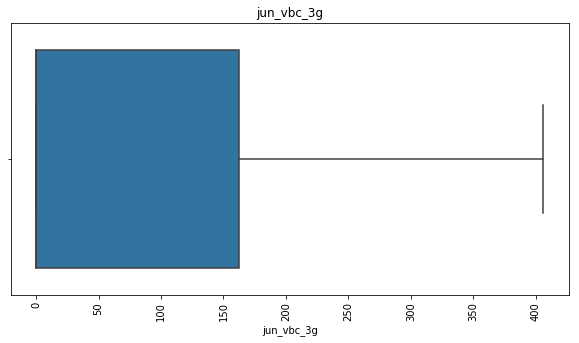

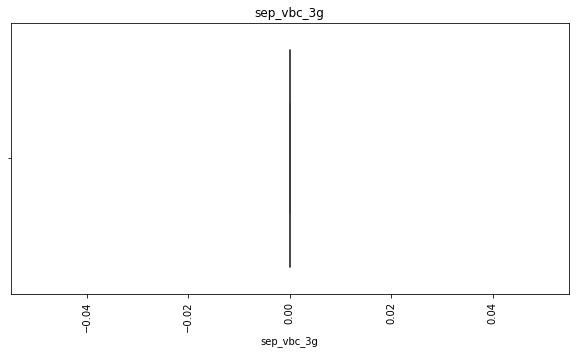

In [44]:
# Looping through each variable of telecom with outliers

for i in out_vars:
    Q1 = telecom[i].quantile(0.25)                         # taking the value of first quantile for each column
    Q3 = telecom[i].quantile(0.75)                         # taking the value of third quantile for eah column

    IQR = Q3 - Q1                                          # finding the inter-quartile range

    lower_fence = Q1 - 1.5*IQR                             # calculating the lower fence
    upper_fence = Q3 + 1.5*IQR                             # calculating the upper fence

    # Replacing all the values lower than the lower fence with the value of lower fence
    telecom[i][telecom[i] <= lower_fence] = lower_fence 

    # Replacing all the values lower than the lower fence with the value of lower fence
    telecom[i][telecom[i] >= upper_fence] = upper_fence

    plt.figure(1, figsize=(10,5))                         # adjusting the image size
    sns.boxplot(telecom[i])                               # creating a box plot for each individual column
    plt.xticks(rotation=90, fontsize=10)                  # rotating the x-axis labels 
    plt.title(i)                                          # setting the title of the plot       
    plt.show()                                            # displaying the plot

<font color = purple> *From the box plots shown above, we can see that there are several features with `0.00` as the predominant value once the outliers are capped. Therefore, we'll remove these variables as well.* </font>

In [45]:
telecom.drop(['roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 
              'loc_og_t2c_mou_6', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'isd_og_mou_6', 
              'isd_og_mou_7', 'isd_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'spl_ic_mou_6', 'spl_ic_mou_7', 
              'spl_ic_mou_8', 'isd_ic_mou_6', 'isd_ic_mou_7', 'isd_ic_mou_8', 'ic_others_7', 'monthly_2g_6', 
              'monthly_2g_7', 'monthly_2g_8', 'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6', 
              'sachet_3g_7', 'sachet_3g_8', 'sep_vbc_3g'], axis=1, inplace=True)

telecom.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,ic_others_6,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn
1,34.047,355.074,268.321000,24.11,78.68,7.68,15.74,99.84,304.760,23.88000,74.56,7.68,11.51,75.94000,291.86,0.000,0.00,0.000,0.275,0.000,35.39,150.51,299.54,0.23,4.11,0.00,0.00000,0.46,0.130,0.23000,4.5800,0.13000,4.68,17.575,12.760,40.31,178.53,312.44,1.61,29.91,29.23,17.48,65.38,375.58,0.00,8.93000,3.61,19.09,104.23,408.43,0.00000,0.00,2.350,5.900,0.000,12.490,0.000,0.00,0.00,5.9000,0.0000,14.8400,26.83,104.23,423.28,0.000,0.000,4,9,11.0,74.0,384.0,283.0,44,154,65.0,29.0,31.0,28.0,44,23,30,0.0,1.0,2.0,0.0,154.0,25.0,0.0,154.0,50.0,0.0,108.07000,238.88125,0.0,0.00,0.00,0.0,0.0,2.0,1006.0,0.00,0.00000,0.00,0
7,1069.180,1349.850,1328.211375,57.84,54.68,52.29,453.43,567.16,325.910,51.39000,31.38,40.28,308.63,435.92125,162.28,9.975,10.45,9.475,0.000,0.000,422.16,533.91,255.79,4.30,23.29,12.01,49.89000,31.76,49.140,60.86000,75.1400,77.84000,4.50,0.000,6.500,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,31.85,33.20625,31.40,427.88,355.23,188.04,17.33125,11.83,16.125,53.325,58.325,52.275,0.575,0.75,0.65,94.2175,100.9425,91.7975,626.46,558.04,428.74,0.125,0.125,5,5,7.0,1580.0,790.0,1573.5,348,348,406.5,27.0,25.0,26.0,0,0,310,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.00,0.00,0.0,0.0,0.0,802.0,57.74,19.38000,18.74,1
8,378.721,492.223,137.362000,413.69,351.03,35.08,94.66,80.63,136.480,169.85375,172.91,12.49,80.96,70.58000,50.54,0.000,0.00,0.000,0.000,0.275,378.09,288.18,63.04,116.56,133.43,22.58,13.69000,10.04,75.690,130.26000,143.4800,98.28000,0.00,0.000,10.230,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00000,0.00,81.43,23.83,15.79,0.00000,0.58,0.100,22.430,4.080,0.650,0.000,0.00,0.00,22.4300,4.6600,0.7500,103.86,28.49,16.54,0.000,0.000,19,21,14.0,437.0,601.0,120.0,90,154,30.0,25.0,31.0,30.0,50,0,10,0.0,2.0,3.0,0.0,154.0,23.0,0.0,177.0,69.0,0.0,343.60625,0.03000,0.0,750.95,11.94,0.0,1.0,2.5,315.0,21.03,527.60625,122.16,0
21,514.453,597.753,637.760000,102.41,132.11,85.14,757.93,896.68,927.275,4.48000,6.16,23.34,91.81,87.93000,104.81,0.750,0.00,1.580,0.000,0.000,97.04,94.09,129.74,97.93,125.94,61.79,270.33125,286.90,219.475,755.44375,844.3625,624.28125,0.00,0.000,0.000,860.34,1028.79,1068.54,2.48,10.19,19.54,118.23,74.63,129.16,4.61,2.84000,10.39,125.33,87.68,159.11,14.06000,5.98,0.180,53.325,38.230,52.275,0.000,0.00,0.00,81.7600,44.2100,91.7975,207.09,131.89,261.04,0.000,0.000,22,26,26.5,600.0,680.0,718.0,50,50,50.0,30.0,31.0,31.0,30,20,50,0

In [46]:
# Checking the shape of the telecom dataframe

telecom.shape

(28016, 105)

In [47]:
# Reviewing value counts for the 'churn' column

telecom['churn'].value_counts()

0    26558
1     1458
Name: churn, dtype: int64

### Univariate Analysis

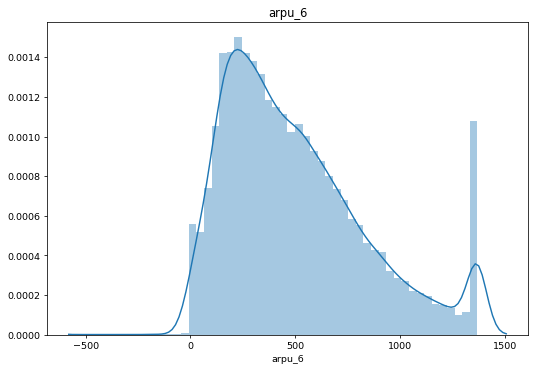

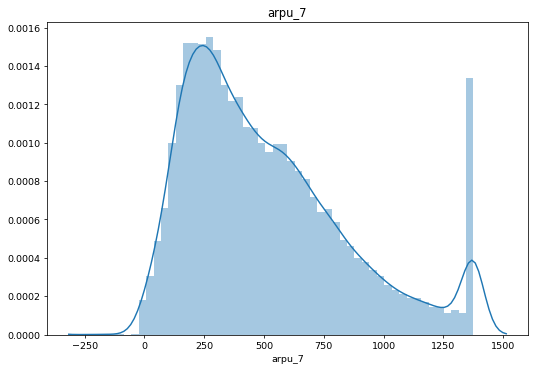

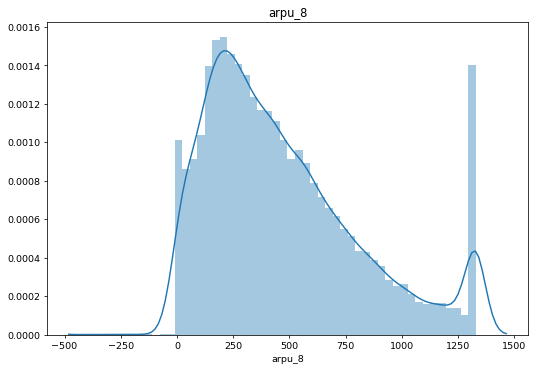

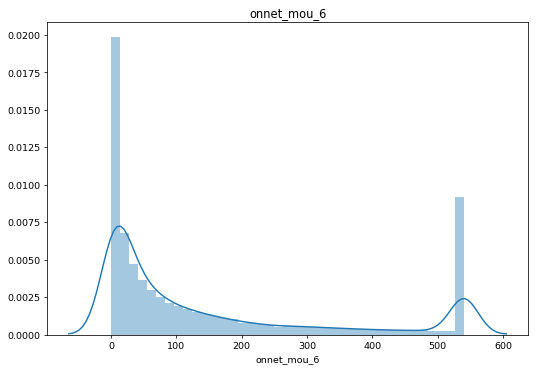

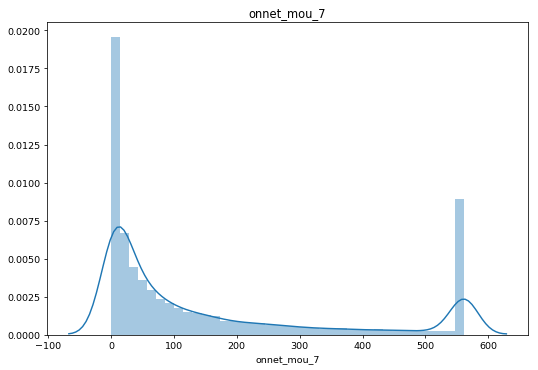

...

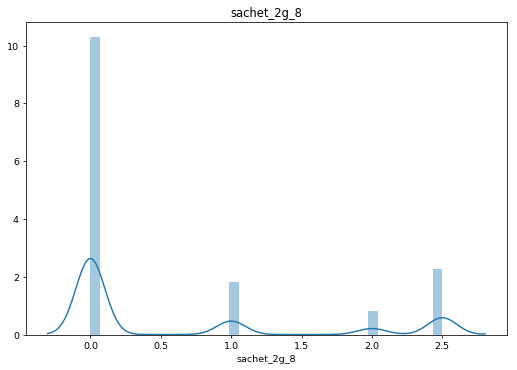

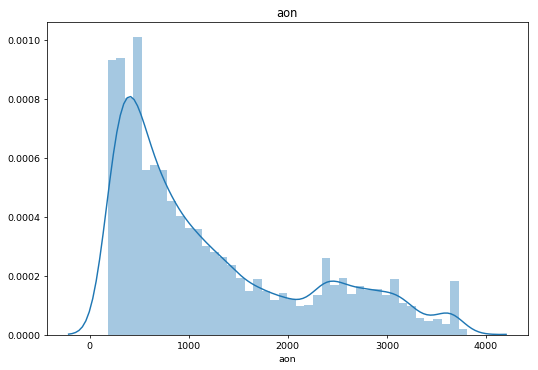

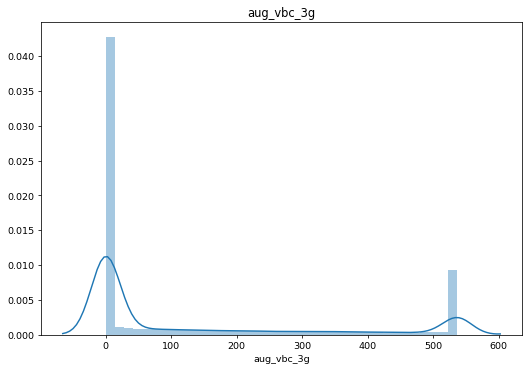

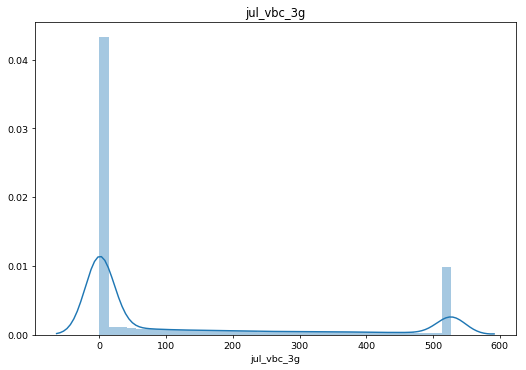

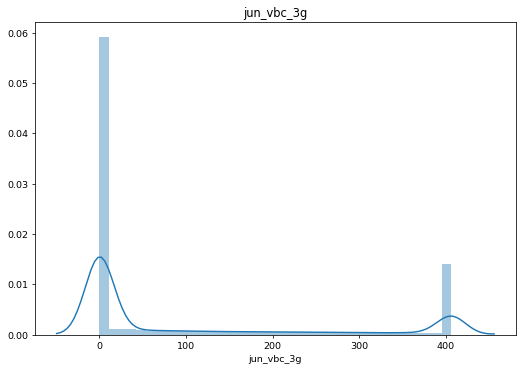

In [48]:
# Univariate analysis of variables

for i in telecom.drop('churn', axis=1).columns:
    
    # set figure size for larger figure
    plt.figure(num=None, figsize=(9, 6), dpi=69, facecolor='w', edgecolor='k')

    # count plot
    ax = sns.distplot(telecom[i])

    # set title
    ax.set_title(i)
    
    # show plot
    plt.show()

### Bivariate Analysis

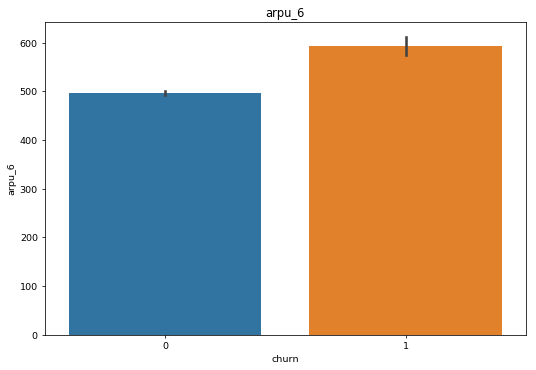

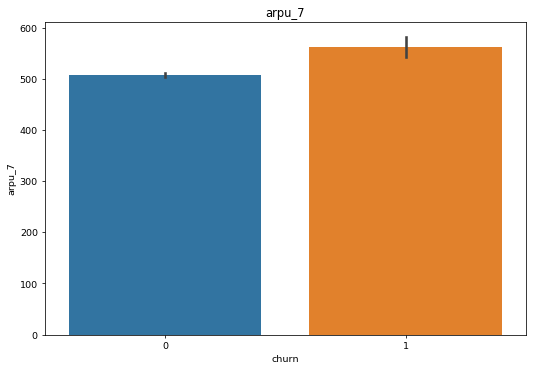

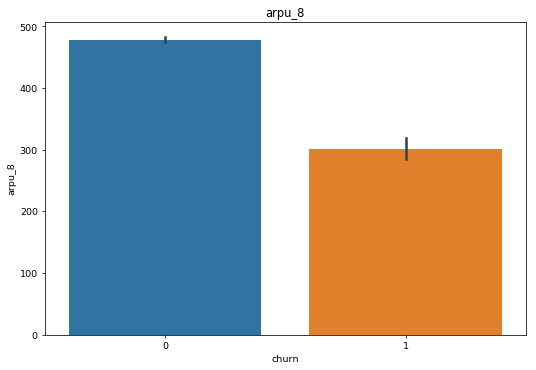

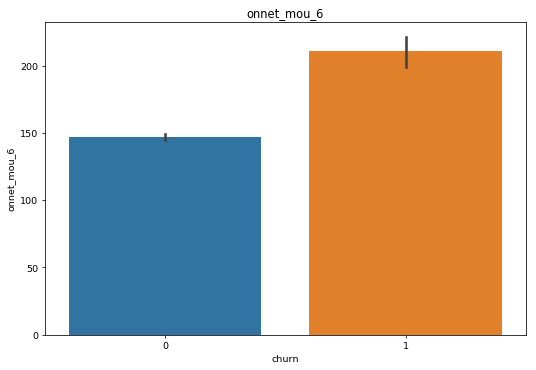

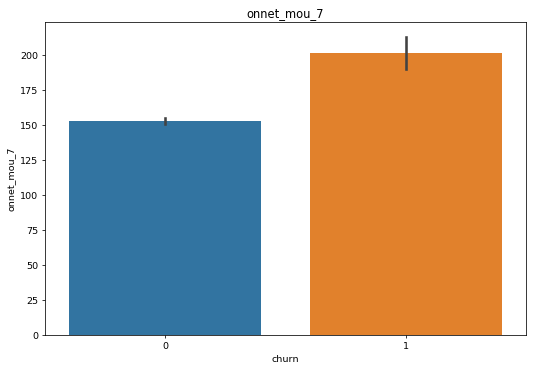

...

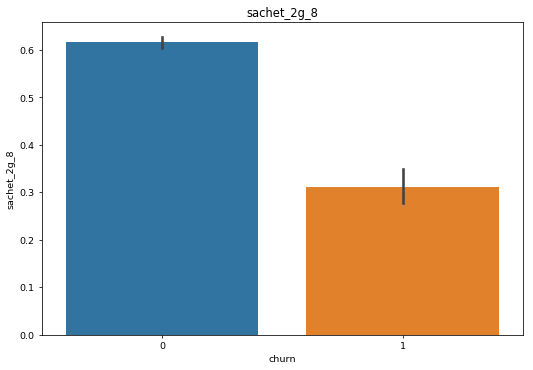

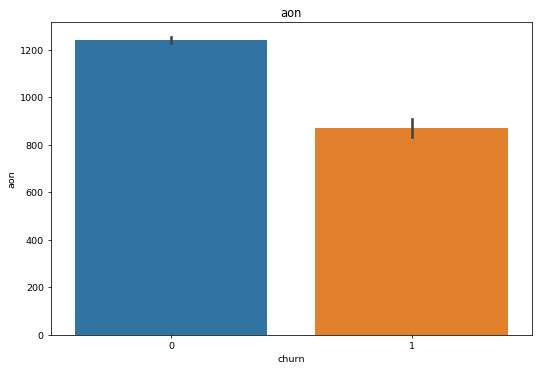

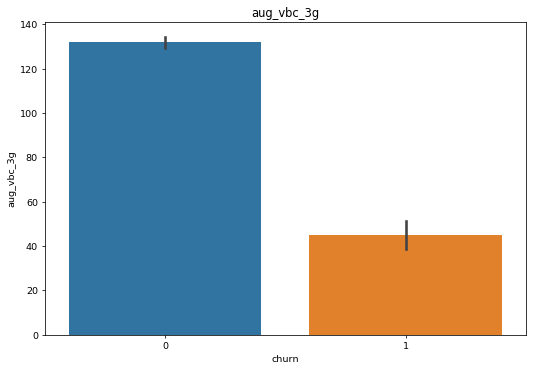

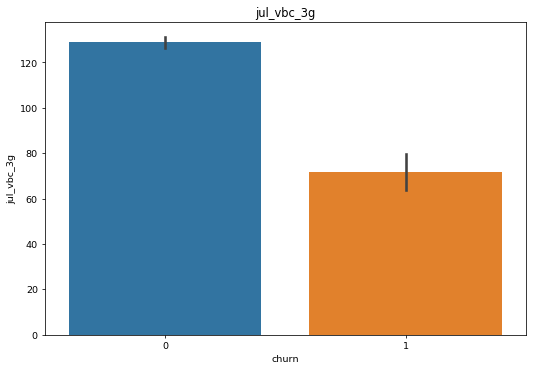

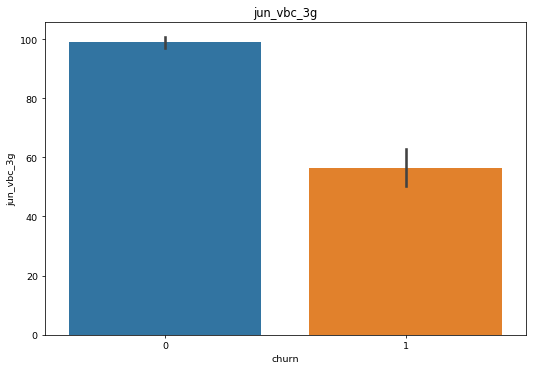

In [49]:
# Bivariate analysis of variables w.r.t 'churn' variable

for i in telecom.drop('churn', axis=1).columns:
    
    # set figure size for larger figure
    plt.figure(num=None, figsize=(9, 6), dpi=69, facecolor='w', edgecolor='k')

    # count plot
    ax = sns.barplot(x='churn', y=i, data=telecom)

    # set title
    ax.set_title(i)
    
    # show plot
    plt.show()

### Splitting the Data into Train and Test Sets

In [50]:
df_train, df_test = train_test_split(telecom, train_size = 0.7, test_size = 0.3, random_state = 100)

### Scaling the features

In [51]:
# Creating a scaler object using StandardScaler()

scaler = StandardScaler()

In [52]:
# Applying scaler() to all the columns except the 'churn' variable

scale_vars = telecom.drop('churn', axis=1).columns.copy()

df_train[scale_vars] = scaler.fit_transform(df_train[scale_vars])

df_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,ic_others_6,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn
37013,-0.628325,-0.763736,-0.415213,0.011442,-0.468566,2.117971,-0.380833,0.035281,-0.069173,1.866981,0.278296,2.174882,0.344627,1.293089,0.807339,-0.680727,-0.681308,-0.604330,-0.580049,1.761409,0.591561,0.766509,2.301305,-0.641607,-0.640487,-0.500847,-0.681125,-0.666400,-0.677840,-0.678668,-0.670430,-0.644727,-0.689106,-0.713852,1.987141,-0.321992,-0.268517,0.678065,-0.523460,2.258101,-0.185505,-0.085119,-0.484429,-0.270874,-0.735917,-0.738833,-0.685067,-0.342545,2.328314,-0.368093,-0.463821,-0.312591,1.305840,-0.614388,-0.743570,-0.729076,-0.586217,-0.582519,-0.58374,-0.668751,-0.715936,-0.390799,-0.493427,2.032540,-0.471554,-0.571275,-0.576869,-0.713536,-1.163788,-0.043129,-0.572280,-0.721557,-0.311226,0.111175,1.180975,0.049956,0.383877,-0.833304,-0.250271,0.937827,2.068289,-0.579545,-0.304813,-0.376465,0.952136,0.698889,1.669486,0.723611,0.151805,0.708245,2.261067,-0.656852,-0.671924,-0.632274,0.724680,1.084015,1.623560,-0.645856,-0.671666,0.416684,-0.152491,0.309839,-0.341236,1.219793,0
56378,-0.022667,-0.172635,0.804278,-0.530392,-0.449421,-0.468409,-0.128281,-0.300650,0.237452,0.078751,0.342897,0.180173,0.890484,0.447962,1.567131,-0.680727,-0.160408,-0.675458,-0.580049,-0.581355,0.469154,0.258800,0.934340,-0.641607,-0.640487,-0.638652,-0.667030,-0.675470,-0.661326,-0.673562,-0.664565,-0.667351,-0.689106,0.694754,-0.706632,-0.368706,-0.447951,-0.133320,0.400981,0.973190,0.494061,-0.020445,0.086708,-0.190659,-0.558392,-0.446737,-0.735337,-0.055100,0.171418,-0.145343,-0.665639,-0.671945,-0.664212,-0.745186,-0.464451,-0.729076,-0.586217,1.027912,-0.58374,-0.786332,-0.608092,-0.772449,-0.270994,-0.073905,-0.346417,-0.571275,-0.576869,-0.713536,-0.403998,-0.338966,-0.008763,-0.082170,0.906517,1.218037,1.180975,1.058718,0.383877,-2.454120,-1.004004,-1.054636,-1.014810,2.006321,-0.304813,-0.376465,0.344194,1.737988,1.669486,1.762128,0.862112,0.708245,2.553218,-0.181575,-0.489833,-0.145013,2.197532,2.224039,2.143489,-0.645856,-0.671666,-0.630016,1.306511,2.052572,2.053861,1.994810,0
3556,0.450249,0.915710,0.780160,1.803107,1.273105,2.117971,2.285612,2.334894,2.015836,-0.638638,-0.253703,-0.552696,-0.765563,-0.734747,-0.710298,-0.680727,-0.681308,-0.675458,-0.580049,-0.581355,-0.775627,-0.655141,-0.714255,1.924769,1.928877,1.906388,2.021245,2.001910,1.987208,2.056967,2.060667,2.027278,0.148751,2.134968,2.123656,1.827980,2.395704,2.408562,-0.502543,-0.232054,-0.730021,-0.852669,-0.821

In [53]:
# Checking correlation in df_train for the numeric variables

df_train.drop('churn', axis=1).corr().style.background_gradient(cmap='coolwarm').set_precision(2)

In [54]:
# Creating X_train and y_train

X_train = df_train.drop('churn', axis=1)

y_train = df_train['churn']

## PCA
#### Applying principal component analysis on the train dataset

In [55]:
X_train.shape

(19611, 104)

In [56]:
pca = PCA(random_state=42)

In [57]:
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='auto', tol=0.0, whiten=False)

#### Components from the PCA

In [58]:
pca.components_

array([[ 0.14845294,  0.15532339,  0.15021355, ..., -0.02672882,
        -0.02965366, -0.02913098],
       [-0.01848668, -0.02866386, -0.00155109, ...,  0.12102515,
         0.11781698,  0.11743346],
       [ 0.07372506,  0.08969317,  0.09682748, ...,  0.16598693,
         0.16867196,  0.15818567],
       ...,
       [ 0.01131746, -0.0011153 , -0.01407448, ...,  0.00167179,
        -0.00089464, -0.00060865],
       [-0.01437147,  0.02064351, -0.0158006 , ..., -0.00109312,
         0.00202974,  0.00026815],
       [ 0.00617182, -0.00719131,  0.00130001, ...,  0.00134145,
        -0.0012168 , -0.00135386]])

#### Looking at the explained variance ratio for each component

In [59]:
pca.explained_variance_ratio_

array([2.12391853e-01, 1.36912970e-01, 7.14766321e-02, 5.59638937e-02,
       4.62196901e-02, 3.09533041e-02, 2.68911799e-02, 2.33458719e-02,
       2.19834465e-02, 1.96394225e-02, 1.90088477e-02, 1.67937207e-02,
       1.56741017e-02, 1.43083499e-02, 1.33829889e-02, 1.30558551e-02,
       1.27492314e-02, 1.20450699e-02, 9.18035087e-03, 8.86542789e-03,
       8.62388341e-03, 8.44656982e-03, 8.27498267e-03, 7.68238289e-03,
       7.58426452e-03, 7.28181877e-03, 7.04695685e-03, 6.84678873e-03,
       6.58733926e-03, 5.91853421e-03, 5.82159249e-03, 5.71619185e-03,
       5.55039225e-03, 5.44195348e-03, 5.22493148e-03, 4.88394056e-03,
       4.84177175e-03, 4.69682067e-03, 4.57364776e-03, 4.34059528e-03,
       4.18724573e-03, 4.04805172e-03, 4.00450674e-03, 3.46019066e-03,
       3.34436236e-03, 3.25679234e-03, 3.10891673e-03, 3.08763697e-03,
       2.89507190e-03, 2.80874627e-03, 2.74910320e-03, 2.68220974e-03,
       2.65915606e-03, 2.64936652e-03, 2.56006554e-03, 2.41687394e-03,
      

#### Making a scree plot for the explained variance

In [60]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)
var_cumu

array([0.21239185, 0.34930482, 0.42078146, 0.47674535, 0.52296504,
       0.55391834, 0.58080952, 0.6041554 , 0.62613884, 0.64577826,
       0.66478711, 0.68158083, 0.69725493, 0.71156328, 0.72494627,
       0.73800213, 0.75075136, 0.76279643, 0.77197678, 0.78084221,
       0.78946609, 0.79791266, 0.80618764, 0.81387003, 0.82145429,
       0.82873611, 0.83578307, 0.84262986, 0.8492172 , 0.85513573,
       0.86095732, 0.86667351, 0.87222391, 0.87766586, 0.88289079,
       0.88777473, 0.8926165 , 0.89731332, 0.90188697, 0.90622757,
       0.91041481, 0.91446286, 0.91846737, 0.92192756, 0.92527192,
       0.92852872, 0.93163763, 0.93472527, 0.93762034, 0.94042909,
       0.94317819, 0.9458604 , 0.94851956, 0.95116892, 0.95372899,
       0.95614586, 0.95837188, 0.9605857 , 0.96267643, 0.96474159,
       0.96677873, 0.96872039, 0.97060713, 0.97242183, 0.97419434,
       0.97590433, 0.97746368, 0.97896979, 0.98041173, 0.98159533,
       0.98274177, 0.98386051, 0.98496869, 0.98603946, 0.98697

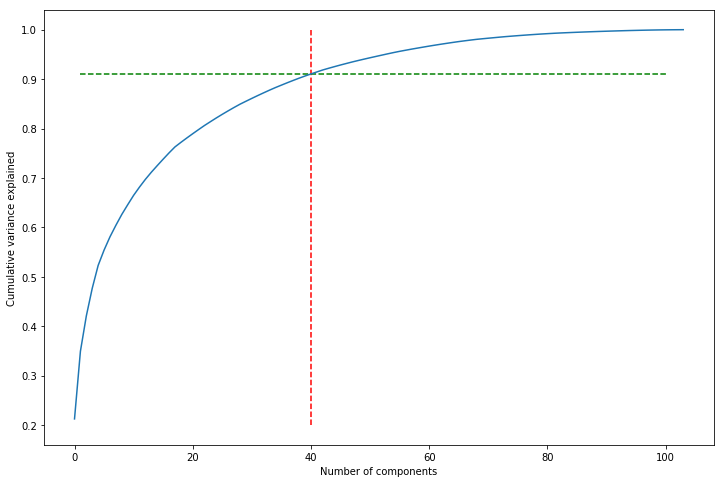

In [61]:
fig = plt.figure(figsize=[12,8])
plt.vlines(x=40, ymax=1, ymin=0.2, colors="r", linestyles="--")
plt.hlines(y=0.91, xmax=100, xmin=1, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.xlabel("Number of components")
plt.ylabel("Cumulative variance explained")
plt.show()

#### PCA with `40` components

In [62]:
pca_final = IncrementalPCA(n_components=40)

In [63]:
X_train_pca = pca_final.fit_transform(X_train)

In [64]:
X_train_pca.shape

(19611, 40)

#### Creating and plotting a correlation matrix for the principal components

In [65]:
corrmat = np.corrcoef(X_train_pca.transpose())

In [66]:
corrmat.shape

(40, 40)

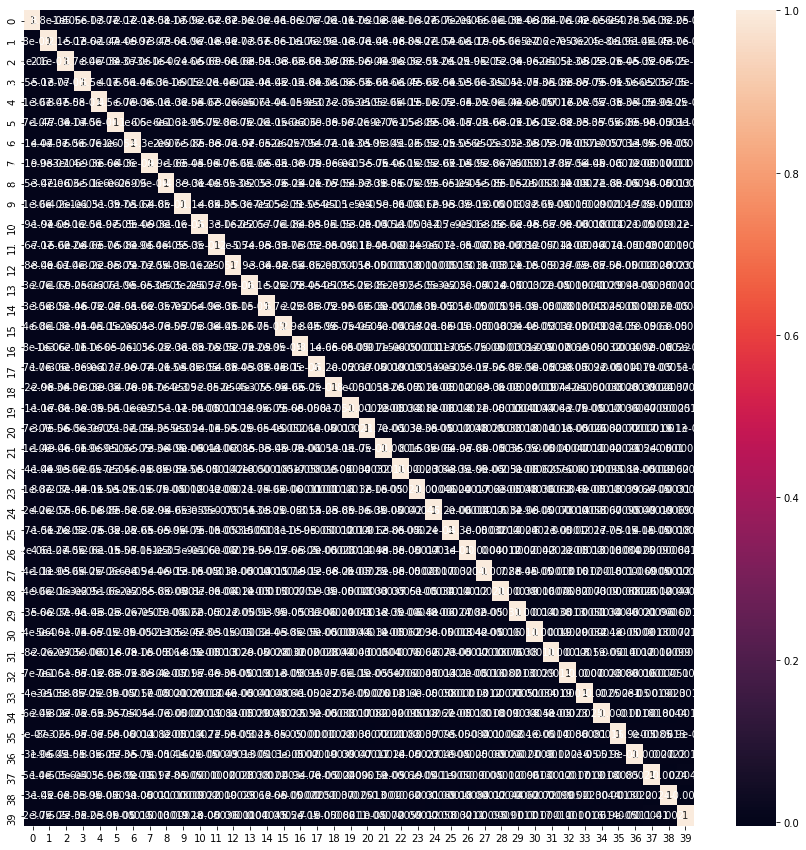

In [67]:
plt.figure(figsize=[15,15])
sns.heatmap(corrmat, annot=True)

<font color = purple> *It's clear from the correlation matrix above that none of the `40` variables are correlated with each other.* </font>

#### Applying the transformation on the test set

In [68]:
df_test[scale_vars] = scaler.transform(df_test[scale_vars])

In [69]:
# Creating X_test and y_test

X_test = df_test.drop('churn', axis=1)

y_test = df_test['churn']

In [70]:
X_test_pca = pca_final.transform(X_test)
X_test_pca.shape

(8405, 40)

### Handling Class Imbalance

In [71]:
# Generating synthetic samples usng imblearn’s SMOTE or Synthetic Minority Oversampling Technique. 
# SMOTE uses a nearest neighbors algorithm to generate new and synthetic data we can use for training our model.

sm = SMOTE(random_state=100)

X_train_pca_sm, y_train_sm = sm.fit_sample(X_train_pca, y_train)

## Model Building

## Logistic Regression
#### Applying logistic regression on our principal components data

In [72]:
smote = LogisticRegression().fit(X_train_pca_sm, y_train_sm)

smote_pred = smote.predict(X_test_pca)

In [73]:
# Checking AUC

roc_auc_score(y_test, smote_pred)

0.8063810138526067

In [74]:
# Checking accuracy

accuracy_score(y_test, smote_pred)

0.8248661511005354

In [75]:
# Recall score

recall_score(y_test, smote_pred)

0.7855626326963907

In [76]:
# F1 score

f1_score(y_test, smote_pred)

0.3345388788426763

In [77]:
# Precision score

precision_score(y_test, smote_pred)

0.2125215393452039

### Hyperparameter Tuning

In [78]:
# Checking the sensitivity of the model using L2 regularization

smote = LogisticRegression(penalty = 'l2', C=0.1, class_weight={0:0.4, 1:0.6})

smote.fit(X_train_pca_sm, y_train_sm)

y_pred = smote.predict(X_test_pca)

print('Accuracy: {0}'.format(round(accuracy_score(y_test, y_pred), 2)))
print('Recall/Sensitivity: {0}'.format(round(recall_score(y_test, y_pred), 2)))
print('AUC: {0}'.format(round(roc_auc_score(y_test, y_pred),2)))

Accuracy: 0.77
Recall/Sensitivity: 0.83
AUC: 0.8


In [79]:
# Cross validation

params = {'C': [0.0001, 0.001, 0.005, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 1, 2], 
         'penalty':['l1', 'l2'], 
         'class_weight': ['balanced', {0:0.4, 1:0.6}]}

smote_model = LogisticRegression()

model = GridSearchCV(estimator = smote_model, cv = 5, param_grid = params, scoring = 'recall')

model.fit(X_train_pca_sm, y_train_sm)

GridSearchCV(cv=5, error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='lbfgs',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.0001, 0.001, 0.005, 0.1, 0.2, 0.3, 0.4, 0.5,
                               0.6, 1, 2],
                         'class_weight': ['balanced', {0: 0.4, 1: 0.6}],
                         'penalty': ['l1', 'l2']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='recall', 

In [80]:
model.best_score_

0.9015247514760055

In [81]:
model.best_params_

{'C': 0.0001, 'class_weight': {0: 0.4, 1: 0.6}, 'penalty': 'l2'}

In [82]:
smote = LogisticRegression(penalty = 'l2', C=0.0001, class_weight={0:0.4, 1:0.6})

smote.fit(X_train_pca_sm, y_train_sm)

y_pred = smote.predict(X_test_pca)

print('Accuracy: {0}'.format(round(accuracy_score(y_test, y_pred), 2)))
print('Recall/Sensitivity: {0}'.format(round(recall_score(y_test, y_pred), 2)))
print('AUC: {0}'.format(round(roc_auc_score(y_test, y_pred),2)))

Accuracy: 0.67
Recall/Sensitivity: 0.85
AUC: 0.76


## Random Forest

In [83]:
# Fitting a random forest model with default parameters

rfc = RandomForestClassifier()

rfc.fit(X_train, y_train)

y_pred = rfc.predict(X_test)

print('Accuracy: {0}'.format(round(accuracy_score(y_test, y_pred), 2)))
print('Recall/Sensitivity: {0}'.format(round(recall_score(y_test, y_pred), 2)))
print('AUC: {0}'.format(round(roc_auc_score(y_test, y_pred),2)))

Accuracy: 0.95
Recall/Sensitivity: 0.22
AUC: 0.61


### Hyperparameter Tuning

In [85]:
# Model with the best hyperparameters

rfc = RandomForestClassifier(class_weight= 'balanced', criterion= 'gini', 
                             min_samples_leaf= 1, min_samples_split= 16, 
                             n_estimators= 700)

rfc.fit(X_train, y_train)

y_pred = rfc.predict(X_test)

print('Accuracy: {0}'.format(round(accuracy_score(y_test, y_pred), 2)))
print('Recall/Sensitivity: {0}'.format(round(recall_score(y_test, y_pred), 2)))
print('AUC: {0}'.format(round(roc_auc_score(y_test, y_pred),2)))

Accuracy: 0.95
Recall/Sensitivity: 0.3
AUC: 0.64


## `Feature Importance`

In [86]:
feature_importance = pd.concat((pd.DataFrame(X_train.columns, columns = ['Variables']), 
                                pd.DataFrame(rfc.feature_importances_, columns=['Importance'])), 
                               axis=1).sort_values(by='Importance', ascending=False).reset_index(drop=True)

feature_importance

,Variables,Importance
0,loc_ic_mou_8,0.061463
1,date_of_last_rech_8,0.050476
2,loc_ic_t2m_mou_8,0.046909
3,last_day_rch_amt_8,0.046779
4,av_rech_amt_data_8,0.046684
5,total_ic_mou_8,0.040428
6,loc_ic_t2t_mou_8,0.028685
7,loc_og_mou_8,0.025830
8,loc_og_t2m_mou_8,0.024176
9,total_rech_amt_8,0.021929


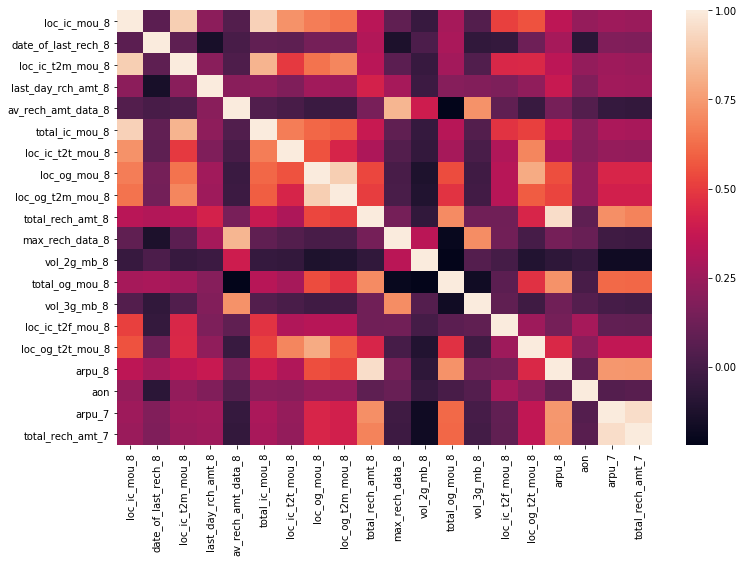

In [87]:
# Checking correlation between the 20 most important features

plt.figure(figsize=[12,8])
sns.heatmap(data=X_train[feature_importance.Variables[0:20]].corr()) 

## `Strategies to manage customer churn`

### The telecom company needs to focus on:
- ### `Local rates` <br> 
    <font color = purple> *The company should provide better offers to the customers who are using services locally. They should offer free incoming and outgoing for their services which can pull in more customers.* </font>
- ### `Day of the month for recharge` & `Recharge amount` <br> 
    <font color = purple> *The company needs to figure out which customers have high recharge frequency but low reharge amount 
vs. customers having low recharge frequency but high recharge amount. Frequent rechargers might be less likely to churn whereas those recharging with a higher amount on average but less often might be more likely to change their minds and churn. 
They should try to identify customers who have recharged right before the end of the action month since they're likely to be loyal customers.* <br>
More packs should be introduced which offer more data recharge amount with the existing voice packs.</font>
### `The telecom company should gather as much customer feedback as possible` <br> <br> `to improve their services and facilitate customer satisfaction.`

# End Case Study